In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
import scipy.sparse as sp
import yaml
import time
import gget
from itertools import combinations
import anndata as an
import scanpy as sc
# import rapids_singlecell as rsc
from scipy.stats import median_abs_deviation
import scanpy.external as sce
from collections import Counter
import gseapy as gp
from gseapy.parser import download_library
import textwrap

sc.settings.verbosity = 2

# Load data

In [2]:
start = time.perf_counter()

path = "/scratch/indikar_root/indikar1/shared_data/HYB/anndata/condition_subsets/pos_myod.h5ad"

adata = sc.read_h5ad(path)

sc.logging.print_memory_usage() 
print(f"Total time: {time.perf_counter() - start:.2f} seconds")

adata

Memory usage: current 2.43 GB, difference +2.43 GB
Total time: 42.07 seconds


AnnData object with n_obs × n_vars = 12388 × 24505
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'filter_pass', 'highly_variable', 'highly_variable_rank', 'means', 'variance

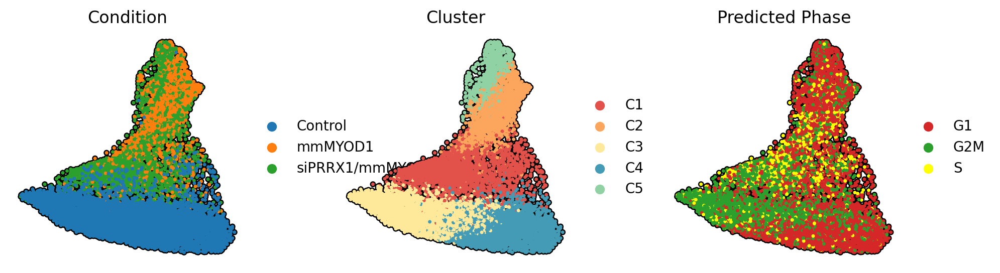

In [3]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.draw_graph(
    adata,
    color=['pooled_condition', 'cluster_str', 'phase'],
    ncols=3,
    size=25,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    alpha=1,
    title=["Condition", "Cluster", "Predicted Phase"],
    hspace=0.5,
)

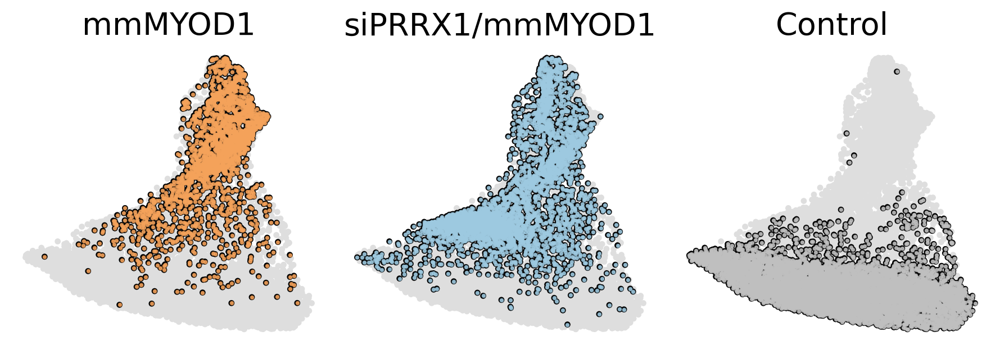

In [72]:
adata.obs['FA_1'] = adata.obsm['X_draw_graph_fa'][:, 0] 
adata.obs['FA_2'] = adata.obsm['X_draw_graph_fa'][:, 1]

predictions = ['mmMYOD1', 'siPRRX1/mmMYOD1', 'Control']

ncols = 3
nrows = int(np.ceil(len(predictions) / ncols))

plt.rcParams['figure.figsize'] = 9, 3.25
plt.rcParams['figure.dpi'] = 200

fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
axes = axes.flatten()

# colors = plt.colormaps['Dark2']
colors = ["#F5A35B", "#9ECAE1", "silver"]

for i, pred in enumerate(predictions):
    ax = axes[i]

    pred_indices = adata.obs['pooled_condition'] == pred

    # Plot background UMAP in grey
    sns.scatterplot(
        data=adata.obs,
        x='FA_1',
        y='FA_2',
        ec='none',
        s=15,
        color='#DEDEDE',
        ax=ax,
    )

    # Plot only the cells with the current prediction
    ax.scatter(
        adata.obs.loc[pred_indices, 'FA_1'],
        adata.obs.loc[pred_indices, 'FA_2'],
        c='black',
        s=15,
        alpha=1,
        edgecolors='none',
        linewidths=0,
    )

    
    ax.scatter(
        adata.obs.loc[pred_indices, 'FA_1'],
        adata.obs.loc[pred_indices, 'FA_2'],
        #c=[colors(i)],
        c=colors[i],
        s=3,
        label=pred,
        alpha=0.8,
        # edgecolors='white',
        # linewidths=0.25,
    )
    
    ax.set_title(pred, fontsize=20)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.axis(False)

# Remove any extra empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

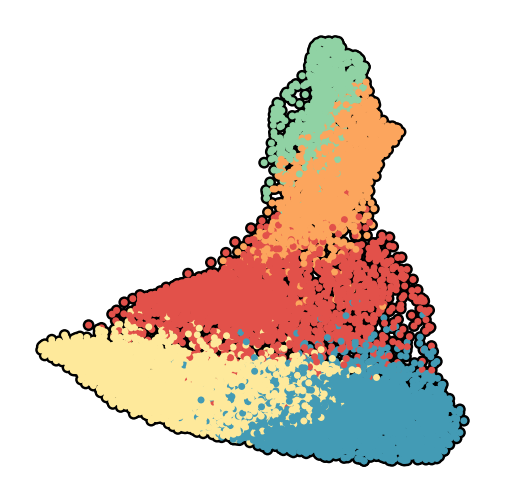

In [73]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.draw_graph(
    adata,
    color='cluster_str',
    # groups='Control',
    ncols=1,
    size=25,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    alpha=1,
    title="",
    legend_loc='none',
    na_color='#DEDEDE',
    # palette='Set3',
)

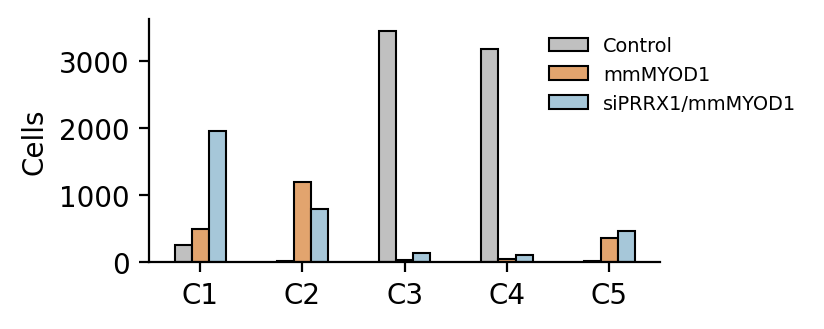

In [86]:
color_map = {
    "siPRRX1/mmMYOD1": "#9ECAE1",
    "mmMYOD1": "#F5A35B",
    "Control": "silver"
}

cdf = pd.DataFrame({
    'cell_id': adata.obs_names,
    'cluster_str': adata.obs['cluster_str'],
    'pooled_condition': adata.obs['pooled_condition'],
})

counts = cdf.groupby(['pooled_condition', 'cluster_str'], observed=True).size().reset_index(name='count')
counts.head()

plt.rcParams['figure.figsize'] = 4.5, 1.75
plt.rcParams['figure.dpi'] = 200

sns.barplot(
    data=counts,
    x='cluster_str',
    y='count',
    hue='pooled_condition',
    width=0.5,
    ec='k',
    linewidth=0.75,
    # legend=False,
    palette=color_map,
)

plt.xlabel("")
plt.ylabel("Cells")


plt.legend(bbox_to_anchor=(1.3, 1), loc='upper right', fontsize='x-small', frameon=False)

sns.despine()
plt.tight_layout()
plt.show()

# DGEs

In [161]:
def get_significant_DEGs(df, alpha=0.05, logfc_thresh=0.5, pct_nz_thresh=0.0):
    
    """ Filters DGE results for significant differentially expressed genes. 
    
    Params
    ------
        df (pd.DataFrame): Dataframe containing DGE results.
        alpha (float): Adjusted p-value threshold for statistical significance. Genes below this threshold are considered significant.
        logfc_thresh (float): Minimum absolute logfoldchange required for a gene to be considered significantly DE. 
        pct_nz_thresh (float): Minimum proportion of cells in the group of interest expressing the gene. Genes expressed in fewer cells than this threshold will be excluded.
    
    """
    
    tmp = df.copy()
    
    print(f"Filtering for significant DEGs (adjusted p-value < {alpha}, logfoldchange > {logfc_thresh})...")

    tmp['abs_lfc'] = tmp['logfoldchanges'].apply('abs')
    tmp = tmp[(tmp['abs_lfc'] > logfc_thresh) & (tmp['pvals_adj'] < alpha)]
    
    # tmp = tmp[(tmp['pct_nz_group'] > pct_nz_thresh) | (tmp['pct_nz_reference'] > pct_nz_thresh)]
    
    if pct_nz_thresh != 0.0:
        tmp = tmp[(tmp['pct_nz_group'] > pct_nz_thresh) | (tmp['pct_nz_reference'] > pct_nz_thresh)]
        print(f"Removed genes expressed in less than {pct_nz_thresh*100}% of cells.")
    
    print(f"N unique significant DEGs: {tmp['names'].nunique()}\n")
    
    return tmp

In [ ]:
# # All clusters vs the rest
# sc.tl.rank_genes_groups(
#     adata, 
#     groupby="pooled_condition",
#     method='wilcoxon',
#     corr_method='benjamini-hochberg',
#     use_raw=False,
#     layer='log_norm',
#     pts=True,
#     key_added='deg_pooled_condition',
# )

# deg = sc.get.rank_genes_groups_df(
#     adata, 
#     group=None,
#     key='deg_pooled_condition',
# )

# print(deg.shape)

# sig1 = get_significant_DEGs(deg, pct_nz_thresh=0.25)
# sig1.head()

In [6]:
# All clusters vs the rest
sc.tl.rank_genes_groups(
    adata, 
    groupby="cluster_str",
    method='wilcoxon',
    corr_method='benjamini-hochberg',
    use_raw=False,
    layer='log_norm',
    pts=True,
    key_added='deg_all_clusters',
)

deg = sc.get.rank_genes_groups_df(
    adata, 
    group=None,
    key='deg_all_clusters',
)

print(deg.shape)

sig = get_significant_DEGs(deg, pct_nz_thresh=0.25)
sig.head()

ranking genes
    finished (0:00:22)
(122525, 8)
Filtering for significant DEGs (adjusted p-value < 0.05, logfoldchange > 0.5)...
Removed genes expressed in less than 25.0% of cells.
N unique significant DEGs: 6061



,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,abs_lfc
0,C1,GAPDH,55.349968,0.912510,0.0,0.0,1.000000,0.982264,0.912510
1,C1,BST2,54.226276,2.122854,0.0,0.0,0.978810,0.679934,2.122854
2,C1,MX1,53.737656,1.145172,0.0,0.0,1.000000,0.982986,1.145172
3,C1,PSME2,51.748745,1.139546,0.0,0.0,0.996283,0.947102,1.139546
4,C1,IFI6,51.477230,0.749214,0.0,0.0,1.000000,0.997319,0.749214


In [7]:
filter_pass_genes = adata.var.query('filter_pass').index

tmp = sig[sig['names'].isin(filter_pass_genes)]

print(tmp['names'].nunique())
tmp.sort_values(by=['group', 'logfoldchanges'], ascending=[True, False]).groupby('group').head()

5384


,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,abs_lfc
58,C1,TNFSF10,35.861221,2.209049,1.229428e-281,3.586564e-279,0.633457,0.187977,2.209049
1,C1,BST2,54.226276,2.122854,0.000000e+00,0.000000e+00,0.978810,0.679934,2.122854
311,C1,KISS1,19.924000,2.095490,2.520330e-88,1.363371e-86,0.372119,0.131161,2.095490
150,C1,IFNE,26.235420,2.088412,1.048478e-151,1.152150e-149,0.442379,0.103939,2.088412
11,C1,RSAD2,48.281349,2.059977,0.000000e+00,0.000000e+00,0.965056,0.549804,2.059977
24505,C2,MYOD1,51.912174,3.049598,0.000000e+00,0.000000e+00,0.939980,0.297448,3.049598
24613,C2,ESR1,25.644630,2.294168,4.853242e-145,3.171432e-143,0.489318,0.146037,2.294168
24673,C2,PLAU,22.785692,2.184673,6.356991e-115,3.172669e-113,0.490844,0.227691,2.184673
24634,C2,HMOX1,24.426449,2.122371,8.956897e-132,5.263520e-130,0.565107,0.318173,2.122371
24833,C2,TAS2R30,18.926270,2.119847,6.929875e-80,2.214036e-78,0.372330,0.118211,2.119847


In [8]:
print("Top marker genes per cluster (sorted by 'scores'):")
pd.DataFrame(adata.uns['deg_all_clusters']['names'][:10])

Top marker genes per cluster (sorted by 'scores'):


,C1,C2,C3,C4,C5
0,GAPDH,MYOD1,ACTB,COL1A1,PPP1R15A
1,BST2,MT-ND4,PFN1,RPL28,RSRC2
2,MX1,TAF1D,ACTG1,DCN,ATF3
3,PSME2,LINC-PINT,TPM4,RPL34,PMAIP1
4,IFI6,IFIT3,CALU,TSPAN9,TAF1D
5,IFITM1,IFIT2,C12orf75,CST3,GADD45A
6,ISG15,XAF1,SEC61G,SERPINE2,HDAC9
7,LAP3,TNFRSF12A,HMGB1,RPLP1,PLK2
8,TPM3,RALA,MYL6,COL1A2,ABL2
9,IFITM2,IRF1,VIM,FTH1,CCNL1


Removing non protein-coding, unnamed, and mitochondrial genes...
N unique DE protein-coding genes: 5646



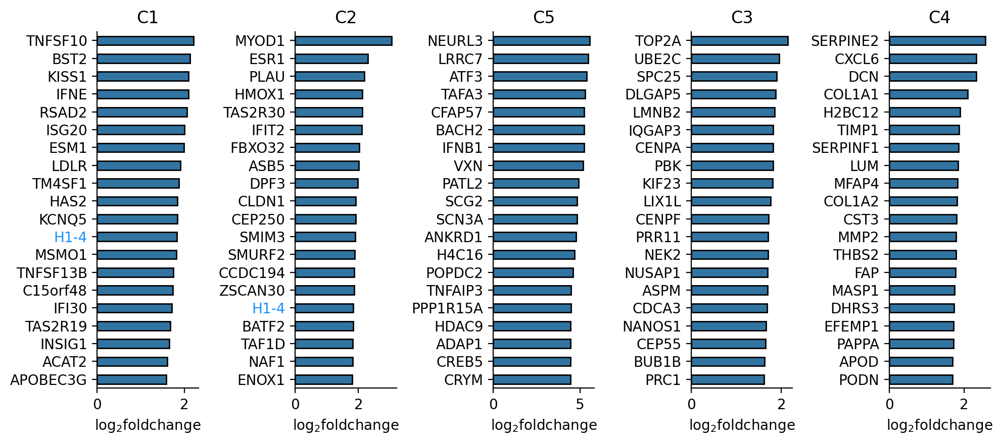

In [45]:
gdf = adata.var[['gene_type', 'mt', 'ribo']].copy()
gdf = gdf.reset_index(names='names')

pdf = pd.merge(sig, gdf, how='left', on='names')

print("Removing non protein-coding, unnamed, and mitochondrial genes...")

pdf = pdf[pdf['gene_type'] == 'protein_coding'] # get only protein-coding genes
pdf = pdf[~pdf['names'].str.startswith(('ENSG', 'MT-'))] # remove unnamed and MT genes

print(f"N unique DE protein-coding genes: {pdf['names'].nunique()}\n")

pdf = pdf.sort_values(by=['group', 'logfoldchanges'], ascending=[True, False])


plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 10, 4.5

fig, axs = plt.subplots(nrows=1, ncols=5)

n_genes = 20

plot_order = ['C1', 'C2', 'C5', 'C3', 'C4']

top_genes_per_group = {}

for group in plot_order:
    df = pdf[pdf['group'] == group].sort_values(by='logfoldchanges', ascending=False)
    top_genes_per_group[group] = df.head(n_genes)['names'].tolist()

# Step 2: Count appearances across groups
gene_counts = Counter()
for gene_list in top_genes_per_group.values():
    gene_counts.update(gene_list)

# Step 3: Categorize genes
red_genes = {gene for gene, count in gene_counts.items() if count == 3}
blue_genes = {gene for gene, count in gene_counts.items() if count == 2}

for i, group in enumerate(plot_order): 
    df = pdf[pdf['group'] == group].sort_values(by='logfoldchanges', ascending=False).head(n_genes)
    ax = axs[i]

    sns.barplot(data=df, x='logfoldchanges', y='names', ax=ax, width=0.5, ec='k')
    ax.set_title(group)
    ax.set_xlabel("log$_2$foldchange")
    ax.set_ylabel("")

    # if group == 'mmMYOD1':
    #     ax.set_xlim([0, 10])
    #     # ax.set_xscale('log')
    # elif group == 'siPRRX1/mmMYOD1':
    #     ax.set_xlim([0, 6])
    #     # ax.set_xscale('log')
    # else:
    #     ax.set_xlim([0, 5])

    for tick in ax.get_yticklabels():
        gene = tick.get_text()
        if gene in red_genes:
            tick.set_color('red')
        elif gene in blue_genes:
            tick.set_color('dodgerblue')

sns.despine()
plt.tight_layout()
plt.show()

In [162]:
# sc.tl.rank_genes_groups(
#     adata, 
#     groupby="pooled_condition",
#     reference='Control',
#     method='wilcoxon',
#     corr_method='benjamini-hochberg',
#     use_raw=False,
#     layer='log_norm',
#     pts=True,
#     key_added='deg_pooled_condition',
# )

deg = sc.get.rank_genes_groups_df(
    adata, 
    group=None,
    key='deg_pooled_condition',
)

print(deg.shape)

sig1 = get_significant_DEGs(deg, pct_nz_thresh=0.0)
sig1.head()

(49010, 7)
Filtering for significant DEGs (adjusted p-value < 0.05, logfoldchange > 0.5)...
N unique significant DEGs: 8757



,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,abs_lfc
0,mmMYOD1,MYOD1,69.423294,32.184967,0.0,0.0,1.000000,32.184967
1,mmMYOD1,MT-ND4,69.307373,2.782195,0.0,0.0,0.999523,2.782195
2,mmMYOD1,LINC-PINT,58.960522,2.708756,0.0,0.0,0.969957,2.708756
3,mmMYOD1,NAV3,58.455883,3.448462,0.0,0.0,0.924654,3.448462
4,mmMYOD1,TAF1D,55.500275,2.707082,0.0,0.0,0.961373,2.707082


In [163]:
gdf = adata.var[['gene_type', 'mt', 'ribo']].copy()
gdf = gdf.reset_index(names='names')

pdf1 = pd.merge(sig1, gdf, how='left', on='names')

print("Removing non protein-coding, unnamed, and mitochondrial genes...")

pdf1 = pdf1[pdf1['gene_type'] == 'protein_coding'] # get only protein-coding genes
pdf1 = pdf1[~pdf1['names'].str.startswith(('ENSG', 'MT-'))] # remove unnamed and MT genes

print(f"N unique DE protein-coding genes: {pdf1['names'].nunique()}\n")

pct_threshold = 0.25
print(f"Filtering for genes exressed in at least {pct_threshold*100}% of the group...\n")
pdf1 = pdf1[pdf1['pct_nz_group'] > pct_threshold] 

up = pdf1[pdf1['logfoldchanges'] > 0]
print(f"N unique upregulated genes: {up['names'].nunique()}")

down = pdf1[pdf1['logfoldchanges'] < 0]
print(f"N unique downregulated genes: {down['names'].nunique()}\n")

Removing non protein-coding, unnamed, and mitochondrial genes...
N unique DE protein-coding genes: 7012

Filtering for genes exressed in at least 25.0% of the group...

N unique upregulated genes: 2476
N unique downregulated genes: 1069



['mmMYOD1', 'siPRRX1/mmMYOD1']


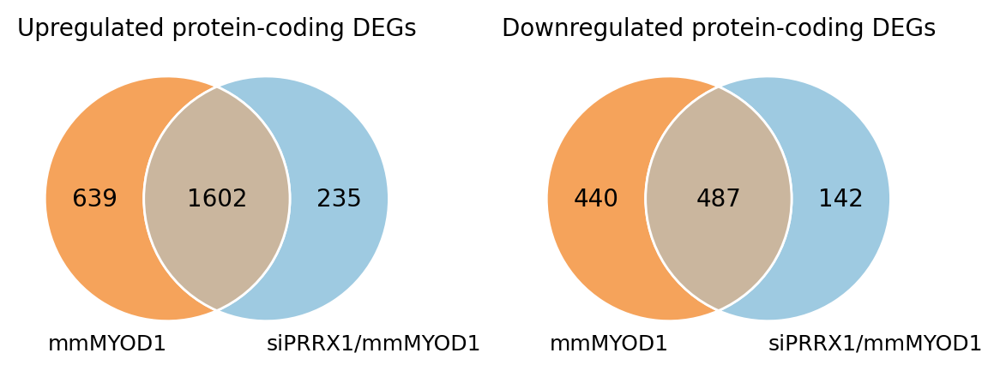

In [170]:
from matplotlib_venn import venn2_unweighted
import matplotlib.colors as mcolors

up_sets = up.groupby('group')['names'].apply(set).to_dict()
down_sets = down.groupby('group')['names'].apply(set).to_dict()

group_names = list(up_sets.keys())  # Assuming same groups in both
print(group_names)

# Colors
colors_rgb = {
    'mmMYOD1': mcolors.to_rgb('#F5A35B'), # orange
    'siPRRX1/mmMYOD1': mcolors.to_rgb('#9ECAE1') # blue
}

def blend(colors):
    arr = np.array(colors)
    return tuple(arr.mean(axis=0))

venn_ids_2 = {
    '10': ['mmMYOD1'],
    '01': ['siPRRX1/mmMYOD1'],
    '11': ['mmMYOD1', 'siPRRX1/mmMYOD1']
}

# Plotting
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = (6, 3)

fig, axs = plt.subplots(1, 2)

for ax, gene_sets, title in zip(axs, [up_sets, down_sets], ['Upregulated', 'Downregulated']):
    plt.sca(ax)

    venn = venn2_unweighted(
        [gene_sets[group_names[0]], gene_sets[group_names[1]]],
        set_labels=(group_names[0], group_names[1])
    )

    for label in venn.set_labels:
        if label:
            label.set_fontsize(9)

    for subset_id, sets in venn_ids_2.items():
        patch = venn.get_patch_by_id(subset_id)
        if patch:
            color = blend([colors_rgb[s] for s in sets])
            patch.set_facecolor(color)
            patch.set_edgecolor('white')
            patch.set_linewidth(1)
            patch.set_alpha(1)
        label = venn.get_label_by_id(subset_id)
        if label:
            label.set_fontsize(10)
            label.set_horizontalalignment('center')
            label.set_verticalalignment('center')

    ax.set_title(f"{title} protein-coding DEGs", fontsize=10)

plt.tight_layout()
plt.show()

In [197]:
mmMYOD1_up = up_sets['mmMYOD1']
hybrid_up = up_sets['siPRRX1/mmMYOD1']

# Unique to mmMYOD1
unique_mmMYOD1 = list(mmMYOD1_up - hybrid_up)
print(len(unique_mmMYOD1))

# Unique to siPRRX1/mmMYOD1
unique_hybrid = list(hybrid_up - mmMYOD1_up)
print(len(unique_hybrid))

# Shared by both
shared_genes = list(mmMYOD1_up & hybrid_up)
print(len(shared_genes))




# tmp = pdf1[(pdf1['group'] == 'mmMYOD1') & (pdf1['names'].isin(unique_mmMYOD1))]
tmp = pdf1[(pdf1['group'] == 'siPRRX1/mmMYOD1') & (pdf1['names'].isin(unique_hybrid))]
# tmp = pdf1[pdf1['names'].isin(shared_genes)]

tmp = tmp.sort_values(by='logfoldchanges', ascending=False)
tmp.head()

639
235
1602


,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,abs_lfc,gene_type,mt,ribo
8285,siPRRX1/mmMYOD1,BANK1,21.055565,6.121096,2.033489e-98,5.273085e-97,0.260895,6.121096,protein_coding,False,False
8310,siPRRX1/mmMYOD1,KRTAP2-3,20.739752,3.204737,1.517045e-95,3.805034e-94,0.301258,3.204737,protein_coding,False,False
8380,siPRRX1/mmMYOD1,MAPK10,19.612940,2.972236,1.198961e-85,2.690526e-84,0.283124,2.972236,protein_coding,False,False
8453,siPRRX1/mmMYOD1,TMEM135,18.592627,2.224486,3.686722e-77,7.466374e-76,0.315297,2.224486,protein_coding,False,False
8477,siPRRX1/mmMYOD1,KISS1,18.303658,2.159402,7.737462e-75,1.515640e-73,0.323194,2.159402,protein_coding,False,False


In [198]:
n_genes = 200
tmp_genes = list(tmp['names'].unique()[:n_genes])
print(len(tmp_genes))

## pd.set_option('display.max_colwidth', None)
database="GO_Biological_Process_2025"
# database="Reactome_Pathways_2024"
# database="KEGG_2021_Human"
# database = "CellMarker_2024"
# database = "TF_Perturbations_Followed_by_Expression"
# database = "WikiPathways_2024_Human"
# database='GO_Molecular_Function_2025'
database='MSigDB_Hallmark_2020' # interesting
# database='Tabula_Sapiens'
n_terms = 10
alpha = 0.05

enr = gp.enrichr(
    gene_list=tmp_genes,
    gene_sets=database,
    organism='human', # Or 'mouse' if appropriate for your data
    outdir=None, # Prevents writing results to disk, if not desired
)

edf = enr.results.copy()

edf[['Term', 'Overlap', 'Adjusted P-value', 'Combined Score']].head(15)

200


,Term,Overlap,Adjusted P-value,Combined Score
0,Interferon Alpha Response,13/97,6.488838e-10,406.571056
1,mTORC1 Signaling,11/200,1.223134e-04,72.933498
2,Cholesterol Homeostasis,6/74,1.399734e-03,82.871357
3,Interferon Gamma Response,9/200,2.042679e-03,41.450606
4,UV Response Dn,6/144,2.840836e-02,25.173855
5,Androgen Response,4/100,1.152679e-01,16.810890
6,PI3K/AKT/mTOR Signaling,4/105,1.152679e-01,15.337914
7,Fatty Acid Metabolism,5/158,1.152679e-01,12.651045
8,G2-M Checkpoint,5/200,1.681763e-01,7.679574
9,Estrogen Response Late,5/200,1.681763e-01,7.679574


In [145]:
fpath = "../../resources/clean_marker_genes.csv"
fdf = pd.read_csv(fpath)

fib = fdf[fdf['category'] == 'fibroblast']['gene_name'].dropna().unique()
print(f"Total fib genes: {len(fib)}")

cells = ['skeletal_muscle', 'myocyte', 'myoblast']
myogenic = fdf[fdf['category'].isin(cells)]['gene_name'].dropna().unique()
print(f"Total myogenic genes: {len(myogenic)}")

just_myo = list(set(myogenic) - set(fib))
print(f"Unique to myogenic: {len(just_myo)}")

just_fib = list(set(fib) - set(myogenic))
print(f"Unique to fib: {len(just_fib)}")

Total fib genes: 461
Total myogenic genes: 455
Unique to myogenic: 293
Unique to fib: 299


In [136]:
top_fib = sig1[sig1['names'].isin(just_fib)].copy()

# top_fib['dataset'] = np.where(top_fib['group'].isin(['C1', 'C2', 'C5']), 'HYB', 'Control')

print(top_fib['names'].nunique())

top_fib.head()

137


,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,abs_lfc
4,Control,CST3,92.167152,2.837323,0.0,0.0,0.999418,0.700870,2.837323
6,Control,COL6A2,89.136238,2.911325,0.0,0.0,0.997963,0.623822,2.911325
8,Control,TIMP1,87.952789,2.942162,0.0,0.0,1.000000,0.928028,2.942162
11,Control,DCN,87.366760,3.287377,0.0,0.0,0.999272,0.679115,3.287377
21,Control,RPS20,81.678009,1.155945,0.0,0.0,0.999854,0.979514,1.155945


In [137]:
top_fib['names'].unique()

array(['CST3', 'COL6A2', 'TIMP1', 'DCN', 'RPS20', 'FAP', 'SERF2', 'UBA52',
       'ITM2B', 'CTSK', 'CD59', 'PLAC9', 'SPARC', 'ANXA5', 'C1R', 'FBLN1',
       'SERPINH1', 'IGFBP4', 'COL6A3', 'CTHRC1', 'ELN', 'C1S', 'EFEMP1',
       'FBLN5', 'THBS1', 'FBLN2', 'DKK3', 'P4HA1', 'SERPINF1', 'EPAS1',
       'EFEMP2', 'MMP3', 'THBS2', 'MGST1', 'MFGE8', 'S100A4', 'S100A11',
       'LTBP2', 'PBX1', 'CCDC80', 'GREM1', 'CLU', 'COL7A1', 'MFAP4',
       'PDGFRA', 'TMSB4X', 'LAMC1', 'CXCL12', 'IGFBP3', 'IGFBP7', 'LAMA4',
       'ZFP36', 'CKAP4', 'CRISPLD2', 'JUND', 'COL15A1', 'SERPING1',
       'CDH11', 'APOD', 'LMNA', 'PDGFRB', 'CD81', 'PODN', 'ENO1', 'DAB2',
       'MMP14', 'FKBP7', 'TUBA1A', 'CYBRD1', 'COL5A3', 'RARRES2',
       'EMILIN1', 'ADAM33', 'DNAJB1', 'COPZ2', 'VEGFA', 'C3', 'MT1M',
       'MFAP5', 'FOSL2', 'IER3', 'ITGBL1', 'ZFP36L2', 'SPON2', 'OAF',
       'COL8A1', 'SNHG18', 'CXCL8', 'KLF6', 'PKD2', 'IL6', 'NAMPT',
       'FGF7', 'TSC22D1', 'NFKBIA', 'JUN', 'PTGS2', 'ID3', 'SLC20A1',
  

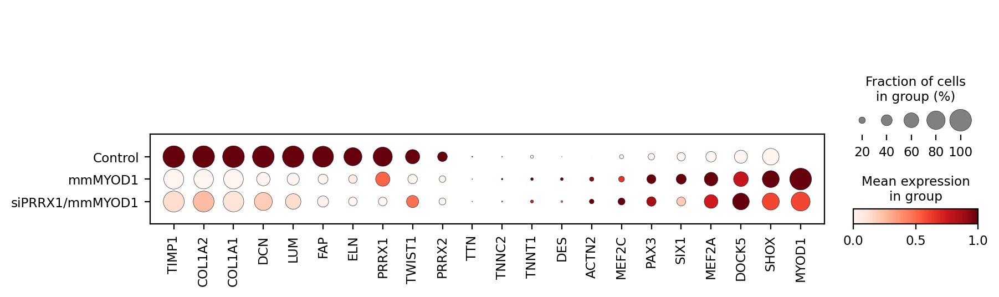

In [196]:
genes_to_plot = {
    "Fibroblast": ['DCN', 'TIMP1', 'FAP', 'COL1A1', 'COL1A2', 'LUM', 'TWIST1', 'PRRX1', 'PRRX2', 'ELN'],
    "Myogenic": ['MYOD1', 'DES', 'SIX1', 'MEF2A', 'MEF2C', 'DOCK5', 'ACTN2', 'SHOX', 'TNNT1', 'PAX3', 'TTN', 'TNNC2',]
}

adata_control = adata[adata.obs['pooled_condition'] == 'Control']
adata_mmMYOD1 = adata[adata.obs['pooled_condition'] == 'mmMYOD1']

# Compute mean expression for fibroblast genes in Control cells
fibro_genes = genes_to_plot["Fibroblast"]
fibro_means = np.array(adata_control[:, fibro_genes].X.mean(axis=0)).flatten()
fibro_sorted = [gene for _, gene in sorted(zip(fibro_means, fibro_genes), reverse=True)]

# Compute mean expression for myogenic genes in mmMYOD1 cells
myogenic_genes = genes_to_plot["Myogenic"]
myogenic_means = np.array(adata_mmMYOD1[:, myogenic_genes].X.mean(axis=0)).flatten()
myogenic_sorted = [gene for _, gene in sorted(zip(myogenic_means, myogenic_genes), reverse=False)]

# Combine into a final ordered list
ordered_genes = fibro_sorted + myogenic_sorted

sc.pl.dotplot(
    adata,
    groupby='pooled_condition',
    var_names=ordered_genes,
    layer='log_norm',
    standard_scale='var',
)

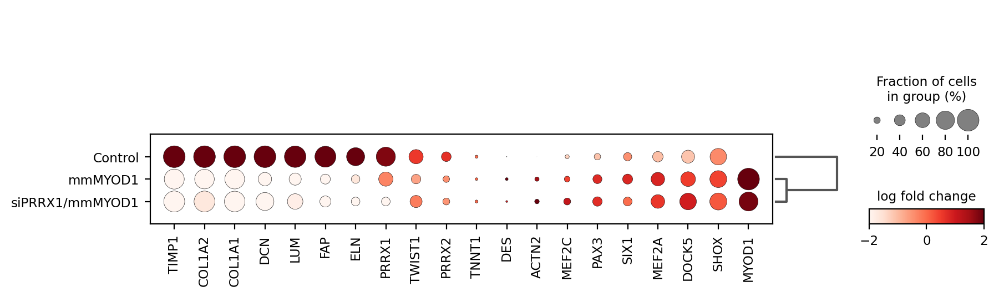

In [148]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    key='deg_pooled_condition',
    values_to_plot='logfoldchanges',
    # standard_scale='var',
    var_names=ordered_genes,
    vmin=-2,
    vmax=2,
)

# GSEA

Running Enrichment on C1 group with 200 genes using database: GO_Biological_Process_2025...
Significant terms for C1: 174
(alpha = 0.05)


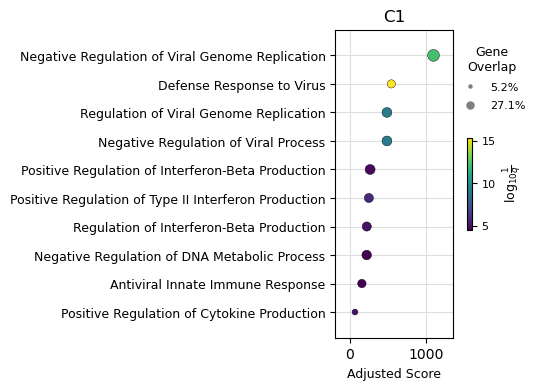

Running Enrichment on C2 group with 200 genes using database: GO_Biological_Process_2025...
Significant terms for C2: 15
(alpha = 0.05)


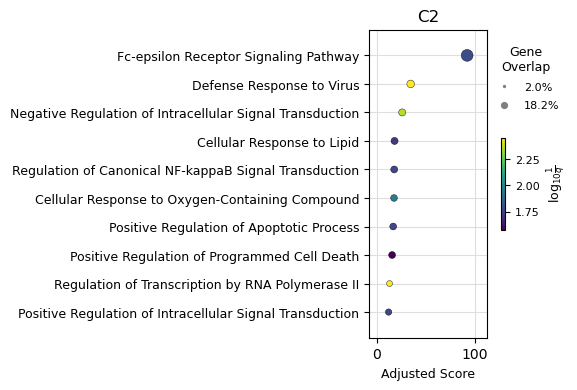

Running Enrichment on C5 group with 200 genes using database: GO_Biological_Process_2025...
Significant terms for C5: 89
(alpha = 0.05)


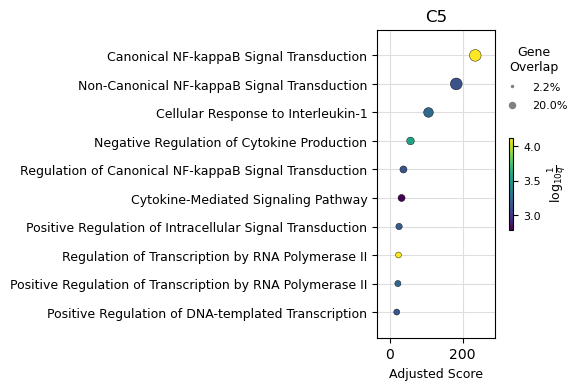

In [26]:
conditions_to_plot = ['C1', 'C2', 'C5']

n_genes = 200 
database="GO_Biological_Process_2025"
# database="Reactome_Pathways_2024"
# database="KEGG_2021_Human"
# database = "CellMarker_2024"
# database = "TF_Perturbations_Followed_by_Expression"
# database = "WikiPathways_2024_Human"
# database='GO_Molecular_Function_2025'
# database='MSigDB_Hallmark_2020' # interesting
# database='Tabula_Sapiens'
n_terms = 10
alpha = 0.05

# Loop through each condition to generate a separate plot
for condition in conditions_to_plot:
    print(f"Running Enrichment on {condition} group with {n_genes} genes using database: {database}...")

    # Filter pdf for the current condition and get gene list
    tmp = pdf[pdf['group'] == condition]
    tmp = tmp.sort_values(by='logfoldchanges', ascending=False)
    gene_list = tmp['names'].head(n_genes).to_list()


    enr = gp.enrichr(
        gene_list=gene_list,
        gene_sets=database,
        organism='human', # Or 'mouse' if appropriate for your data
        outdir=None, # Prevents writing results to disk, if not desired
    )
    edf = enr.results.copy()


    # Filter for significant terms
    # Ensure there are significant terms before proceeding to plotting
    if not edf.empty:
        edf = edf[edf['Adjusted P-value'] < alpha].copy()
        print(f"Significant terms for {condition}: {edf['Term'].nunique()}\n(alpha = {alpha})")

        if edf.empty:
            print(f"No significant terms found for condition: {condition}. Skipping plot.")
            continue # Skip to the next condition if no significant terms

        # Create plotting columns
        overlap_split = edf["Overlap"].str.split("/", expand=True).astype(int)
        edf['Overlap_pct'] = (100 * overlap_split[0] / overlap_split[1]).round(1)
        edf['log10_adj_pval'] = np.log10(1 / edf['Adjusted P-value'])
        # Remove (GO:...) and (Reactome:...) identifiers from term names
        edf['Term'] = edf['Term'].str.replace(r'\s\(GO:\d+\)', '', regex=True)
        edf['Term'] = edf['Term'].str.replace(r'\s\(Reactome:R-HSA-\d+\)', '', regex=True)

        # Calculate combined score with adjusted p-val
        edf['adj_score'] = -np.log(edf['Adjusted P-value']) * edf['Odds Ratio']

        # Get top n terms sorted by significance (Adjusted P-value)
        edf = edf.sort_values(by='Adjusted P-value', ascending=True).head(n_terms).copy()

        # Sort by adjusted combined score for plotting (descending)
        edf = edf.sort_values(by='adj_score', ascending=False).copy()

        # --- Plotting Code for current condition ---
        # Create a new figure and axes for each plot in the loop
        fig, ax = plt.subplots(figsize=(2, 4))

        sns.scatterplot(
            data=edf,
            x='adj_score',
            y='Term',
            ec='k', # Edge color
            linewidth=0.3,
            hue='log10_adj_pval', # Color by log10(1/Adjusted P-value)
            palette='viridis', # Color map
            size='Overlap_pct', # Size of points by overlap percentage
            zorder=3, # Ensures scatter points are on top of grid
            ax=ax # Explicitly pass the axes object to seaborn
        )

        x_margin = 0.25
        y_margin = 0.1
        ax.margins(x=x_margin, y=y_margin)

        # Add grid
        ax.grid(
            True,
            c='#DEDEDE', # Grid color
            zorder=0, # Ensures grid is behind scatter points
        )

        ax.set_ylabel("")

        # --- Y-tick label wrapping ---
        original_ylabels = edf['Term'].to_list()
        wrap_width = 60 # Adjust this width as needed for your plot size and text length
        wrapped_ylabels = [textwrap.fill(label, wrap_width) for label in original_ylabels]
        ax.set_yticklabels(wrapped_ylabels, fontsize=9)
        # --- End of Y-tick label wrapping ---

        # Colorbar for log10_adj_pval
        norm = plt.Normalize(edf['log10_adj_pval'].min(), edf['log10_adj_pval'].max())
        sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
        sm.set_array([])
        # `fig.colorbar` is used with `ax` to attach it to the current axes' figure
        cbar = fig.colorbar(sm, ax=ax, orientation='vertical', pad=0.09, shrink=0.3)
        cbar.set_label('log$_{10} \\frac{1}{q}$', fontsize='9')
        cbar.ax.tick_params(labelsize=8)

        # Overlap percentage legend
        min_overlap = edf['Overlap_pct'].min()
        max_overlap = edf['Overlap_pct'].max()

        # Scaling for legend handles to match scatterplot point sizes
        scaled_min_size = min_overlap * 3 # Adjust multiplier (3) to match visual size
        scaled_max_size = max_overlap * 3 # Adjust multiplier (3) to match visual size

        legend_handles = [
            plt.Line2D([0], [0], marker='o', color='gray', label=f'{min_overlap:.1f}%',
                       markersize=np.sqrt(scaled_min_size / np.pi), linestyle=''),
            plt.Line2D([0], [0], marker='o', color='gray', label=f'{max_overlap:.1f}%',
                       markersize=np.sqrt(scaled_max_size / np.pi), linestyle='')
        ]

        # Gene Overlap legend setup
        legend = ax.legend(handles=legend_handles, title='Gene\nOverlap',
                            loc='upper right', # Location of the legend
                            bbox_to_anchor=(1.7, 0.98), # Position relative to the axes (adjusted for space)
                            fontsize=8, title_fontsize=9, frameon=False, labelspacing=0.75)


        legend_title = legend.get_title()
        legend_title.set_ha('center')
        ax.set_xlabel("Adjusted Score", fontsize=9)
        ax.set_title(f"{condition}")
        plt.tight_layout(rect=[0, 0, 1.4, 1])
        plt.show()

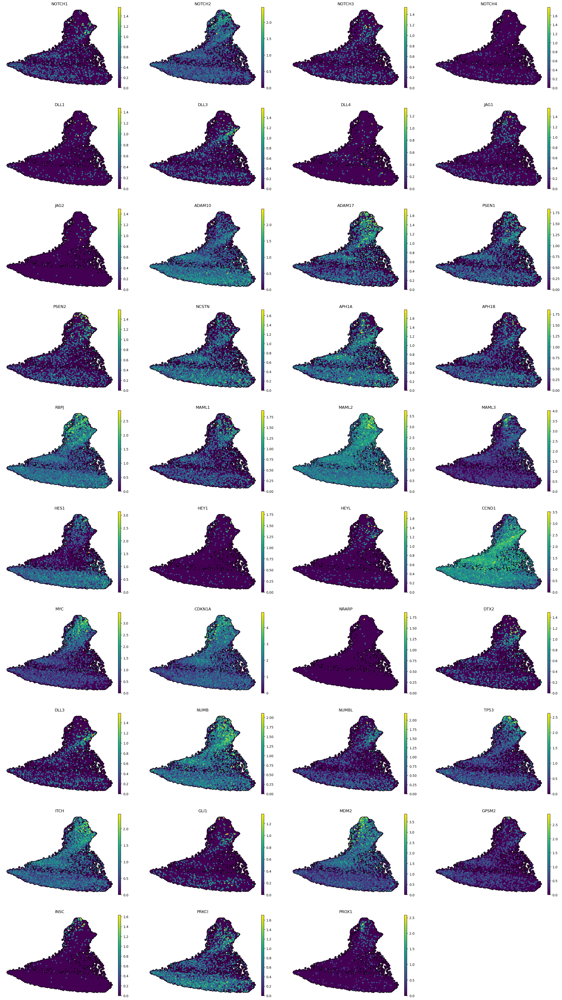

In [25]:
genes_to_plot = [
    'NOTCH1', 'NOTCH2', 'NOTCH3', 'NOTCH4', 'DLL1', 'DLL3', 'DLL4', 'JAG1', 'JAG2', # core Notch signaling components
    'ADAM10', 'ADAM17', 'PSEN1', 'PSEN2', 'NCSTN', 'APH1A', 'APH1B', 'PEN2', 'NICD', 'RBPJ', 'MAML1', 'MAML2', 'MAML3', # Notch signal transduction/activation
    'HES1', 'HES5', 'HEY1', 'HEY2', 'HEYL', 'CCND1', 'MYC', 'CDKN1A', 'NRARP', 'DTX1', 'DTX2', 'DLL3', # Canonical Notch targets
    'NUMB', 'NUMBL', 'TP53', 'ITCH', 'GLI1', 'MDM2',
    'LGN', 'GPSM2', 'INSC', 'PAR3', 'PAR6', 'PRKCI',
    'ASCI1', 'SOX2', 'PROX1',
]
    

genes_to_plot = [gene for gene in genes_to_plot if gene in adata.var_names]

plt.rcdefaults()
sc.pl.draw_graph(
    adata,
    color=genes_to_plot,
    ncols=4,
    size=60,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    alpha=1,
    layer='log_norm',
)

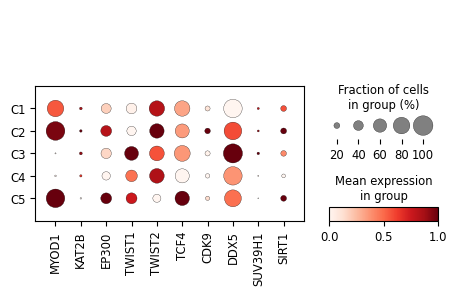

In [13]:
plt.rcdefaults()
sc.pl.dotplot(
    adata,
    groupby='cluster_str',
    # groupby='pooled_condition',
    var_names=['MYOD1', 'KAT2B', 'EP300', 'TWIST1', 'TWIST2', 'TCF4', 'CDK9', 'DDX5', 'SUV39H1', 'SIRT1'],
    layer='log_norm',
    standard_scale='var',
)

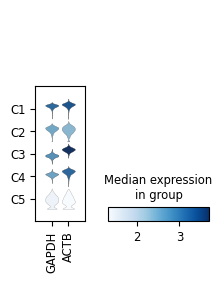

In [157]:
plt.rcdefaults()
sc.pl.stacked_violin(
    adata,
    groupby='cluster_str',
    # groupby='pooled_condition',
    # var_names=['NUMB', 'ITCH', 'HES1', 'YAP1', 'MDM2', 'MYC', 'JUN', 'FOXO3', 'NOTCH1', 'NOTCH2', 'RB1', 'RBPJ', 'TOP2A', 'KLF2', 'KLF7'],
    var_names=['GAPDH', 'ACTB'],
    layer='log_norm',
    # standard_scale='var',
)

# Gene scoring

In [49]:
fpath = "../../resources/genes_for_scoring.csv"

df = pd.read_csv(fpath)
print(df.shape)
print(df.columns.tolist())
df.head()

(512, 18)
['G1/S_transition', 'G2/M_transition', 'CC_checkpoints', 'Cell_cycle_reg', 'Pos_proliferation', 'Neg_proliferation', 'quiescence', 'AS', 'Chromatin', 'Circadian', 'Core_repro', 'NOTCH_signaling', 'Asymm_PCP', 'FOXO', 'p53_acyivity', 'DREAM/negE2F', 'senes_stress', 'sasp']


,G1/S_transition,G2/M_transition,CC_checkpoints,Cell_cycle_reg,Pos_proliferation,Neg_proliferation,quiescence,AS,Chromatin,Circadian,Core_repro,NOTCH_signaling,Asymm_PCP,FOXO,p53_acyivity,DREAM/negE2F,senes_stress,sasp
0,FBXW7,CDC25A,CHFR,YTHDF2,EMP2,IGFBP5,ATF3,CWC27,H2AJ,TEF,HDAC9,FBXW7,SMURF2,TXN,MAPK11,CDC25A,H2AZ2,H2AZ2
1,CCNP,CDK6,CDK1,PRKCA,TNXB,ZBTB7C,ATF4,DDX20,HCFC1,SFPQ,POLR2C,ST3GAL4,SMURF1,PLXNA4,TPX2,CDK1,ACD,H2BC9
2,EZH2,NES,MRNIP,OBSL1,CX3CL1,NTRK1,CTNNB1,RBM3,INO80E,THRAP3,PTN,FCER2,WNT5A,SOD2,TAF9B,E2F1,H2BC9,JUN
3,APBB1,CDK1,DGKZ,LOC102724428,CCND2,KDF1,BACH2,RBM5,HDAC8,NKX2-1,JUN,PSMA7,SCRIB,KAT2B,DYRK2,LIN52,H2BC4,UBE2C
4,DDX3X,FBXL15,BARD1,MAGEA4,LIG4,BTG3,JUN,RBM23,BAZ2A,LOC102724428,MED31,TBL1X,PSMC6,IGFBP1,MDM4,RBL1,H2BC5,H2BC4


computing score 'All_G1/S_transition_score'
    finished (0:00:01)
computing score 'DE_G1/S_transition_score'
    finished (0:00:01)
computing score 'All_G2/M_transition_score'
    finished (0:00:01)
computing score 'DE_G2/M_transition_score'
    finished (0:00:01)
computing score 'All_CC_checkpoints_score'
    finished (0:00:01)
computing score 'DE_CC_checkpoints_score'
    finished (0:00:01)
computing score 'All_Cell_cycle_reg_score'
    finished (0:00:01)
computing score 'DE_Cell_cycle_reg_score'
    finished (0:00:01)
computing score 'All_Pos_proliferation_score'
    finished (0:00:01)
computing score 'DE_Pos_proliferation_score'
    finished (0:00:01)
computing score 'All_Neg_proliferation_score'
    finished (0:00:01)
computing score 'DE_Neg_proliferation_score'
    finished (0:00:01)
computing score 'All_quiescence_score'
    finished (0:00:01)
computing score 'DE_quiescence_score'
    finished (0:00:01)
computing score 'All_AS_score'
    finished (0:00:01)
computing score 'DE_A

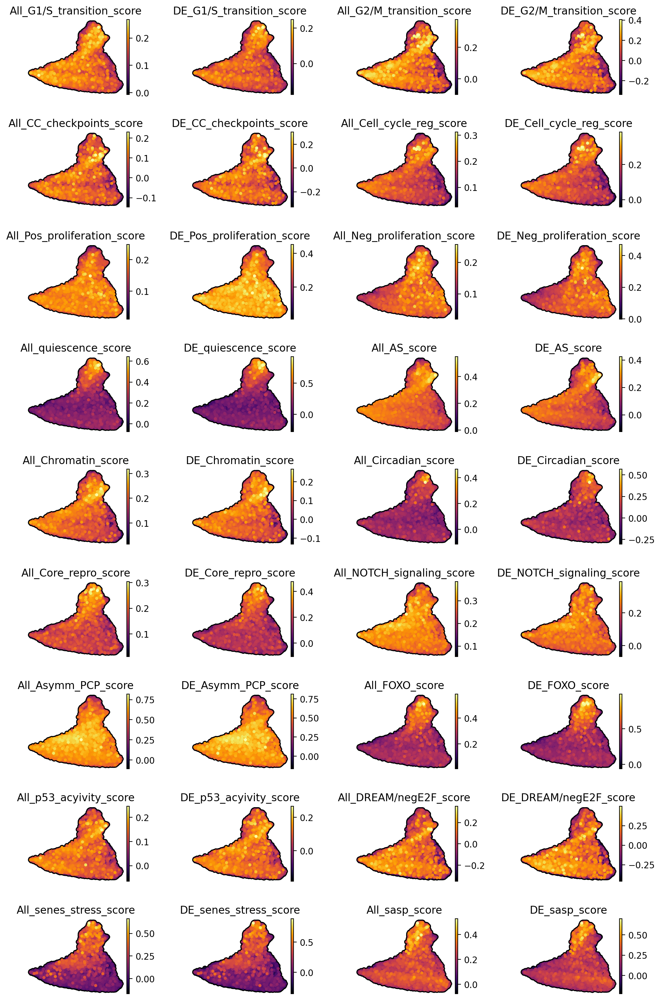

In [18]:
min_ctrl_size = 500

for geneset in df.columns:    
    
    all_score_name = f"All_{geneset}_score"
    de_score_name = f"DE_{geneset}_score"
    
    # Skip if scores already exist
    if all_score_name in adata.obs.columns and de_score_name in adata.obs.columns:
        print(f"Skipping {geneset}, scores already exist.")
        continue
        
    # get all genes belonging to geneset
    all_gene_list = df[geneset].unique()
    all_gene_list = [gene for gene in all_gene_list if gene in adata.var_names]
    
    # get DE geneset genes from adata
    sig_genes = sig['names'].unique()
    de_gene_list = [gene for gene in sig_genes if gene in all_gene_list]
    
    # Set the ctrl_size to either 500 or the length of the gene list (whichever is larger)
    all_ctrl_size = max(min_ctrl_size, len(all_gene_list)) 
    de_ctrl_size = max(min_ctrl_size, len(de_gene_list))
    
    # Score ALL genes in geneset
    sc.tl.score_genes(
        adata,
        gene_list=all_gene_list,
        score_name=all_score_name,
        ctrl_size=all_ctrl_size,
        use_raw=False,
        layer='log_norm',
    )

    # Score just DE genes in geneset
    sc.tl.score_genes(
        adata,
        gene_list=de_gene_list,
        score_name=de_score_name,
        ctrl_size=de_ctrl_size,
        use_raw=False,
        layer='log_norm',
    )
    
print("Finished.")

scores_to_plot = [col for col in adata.obs if col.startswith(('DE', 'All'))]
print(len(scores_to_plot))

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 2, 2

sc.pl.draw_graph(
    adata,
    color=scores_to_plot,
    size=50,
    ncols=4,
    add_outline=True,
    outline_color=('k', 'k'),
    color_map='inferno',
    frameon=False,
    alpha=1,
    show=True,
    hspace=0.5,
    wspace=0.5,
)

In [20]:
adata

AnnData object with n_obs × n_vars = 12388 × 24505
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'All_G1/S_transition_score', 'DE_G1/S_transition_score', 'All_G2/M_transition_score', 'DE_G2/M_transition_score', 'All_CC_checkpoints_score', 'DE_CC_checkpoints_score', 'All_Cell_cycle_reg_score', 'DE_Cell_cycle_reg_score', 'All_Pos_proliferation_score', 'DE_Pos_proliferation_score',

In [21]:
colors = adata.uns['cluster_str_colors']
colors

array(['#E2514A', '#FCA55D', '#FEE99B', '#439BB5', '#90D2A4'],
      dtype=object)

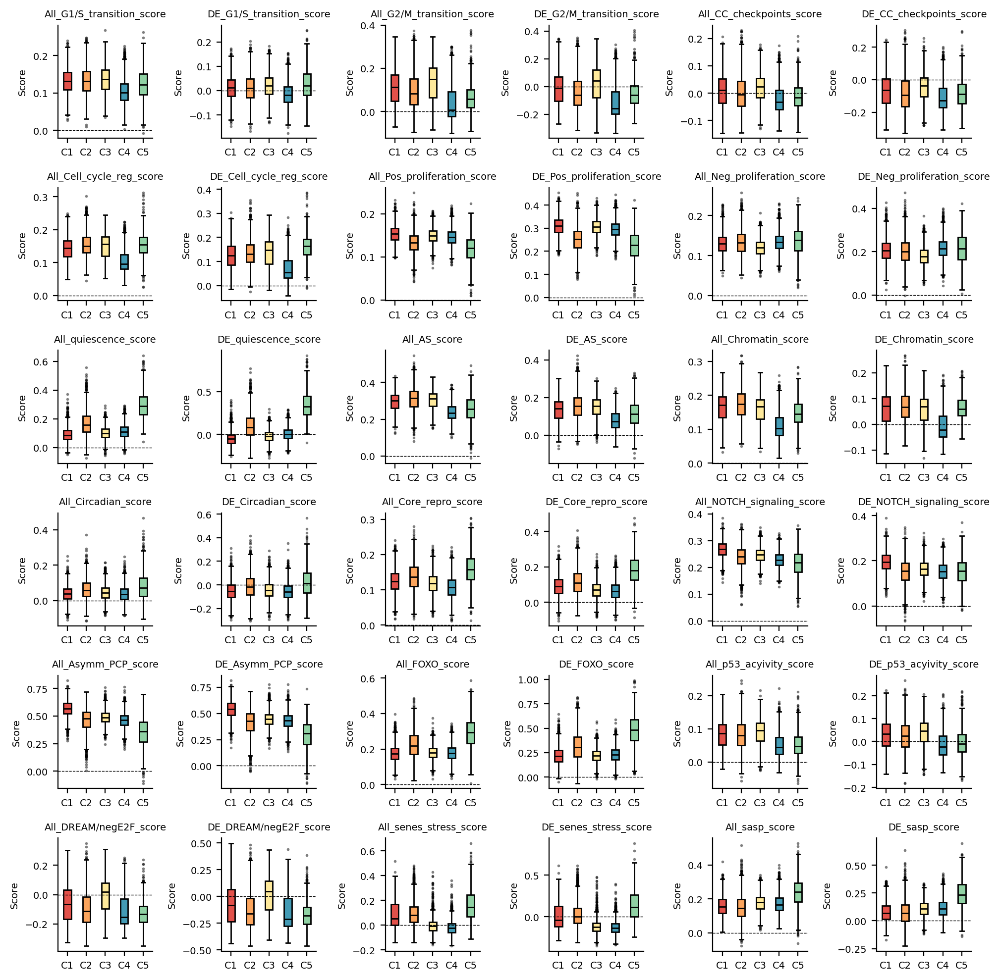

In [22]:
ncols = 6
nrows = round(len(scores_to_plot)/ncols)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 10), dpi=200)
axes = axes.flatten()

for i, score in enumerate(scores_to_plot):
    ax = axes[i]
    
    title = score
    
    sns.boxplot(
        data=adata.obs,
        x='cluster_str',
        y=score,
        width=0.4,
        linecolor='k',
        hue='cluster_str',
        palette=colors,
        legend=False,
        saturation=1,
        flierprops={'markersize': 1, 'alpha': 0.5},
        ax=ax,
        zorder=0,
    )
    
    ax.axhline(0, linestyle='--', linewidth=0.5, color='k', zorder=1)
    
    ax.set_title(title, fontsize=7)
    ax.set_xlabel("")
    # ax.xticks(fontsize=7)
    ax.set_ylabel("Score", fontsize=7)
    ax.tick_params(axis='both', labelsize=7)
    sns.despine(ax=ax)

plt.tight_layout()
plt.show()

# Cell cycle

In [28]:
regev_genes = [x.strip() for x in open('../../resources/regev_lab_cell_cycle_genes.txt')]
s_genes = regev_genes[:43]
g2m_genes = regev_genes[43:]

In [23]:
path_2025 = "/home/jrcwycy/.cache/gseapy/Enrichr.GO_Biological_Process_2025.gmt"

geneset_dict = {}

with open(path_2025, "r") as f:
    for line in f:
        parts = line.strip().split('\t')
        if len(parts) >= 1:
            term = parts[0].strip()
            genes = parts[2:] if len(parts) > 2 else []
            genes = [g.strip() for g in genes if g.strip()]
            geneset_dict[term] = genes

geneset = pd.DataFrame.from_dict(geneset_dict, orient='index').T

In [27]:
[col for col in geneset if 'G0' in col]

['Regulation of G0 to G1 Transition (GO:0070316)']

In [26]:
g0_to_g1 = geneset['Regulation of G0 to G1 Transition (GO:0070316)'].unique()
g0_to_g1

array(['SMARCC1', 'SMARCC2', 'CDKN2B', 'PBRM1', 'PHF10', 'RRM1', 'ACTL6B',
       'SMARCE1', 'SOX15', 'ARID1A', 'ARID1B', 'HLA-G', 'SMARCA2',
       'SMARCA4', 'DAB2IP', 'RRM2B', 'RHNO1', 'SMARCD1', 'SMARCD2',
       'SMARCB1', 'SMARCD3', 'DUX4', 'FOXO4', 'BCL7B', 'CHEK1', 'BCL7A',
       'DPF1', 'BCL7C', 'DPF2', 'DPF3', 'POTEF', 'BRD7', 'ARID2', None],
      dtype=object)

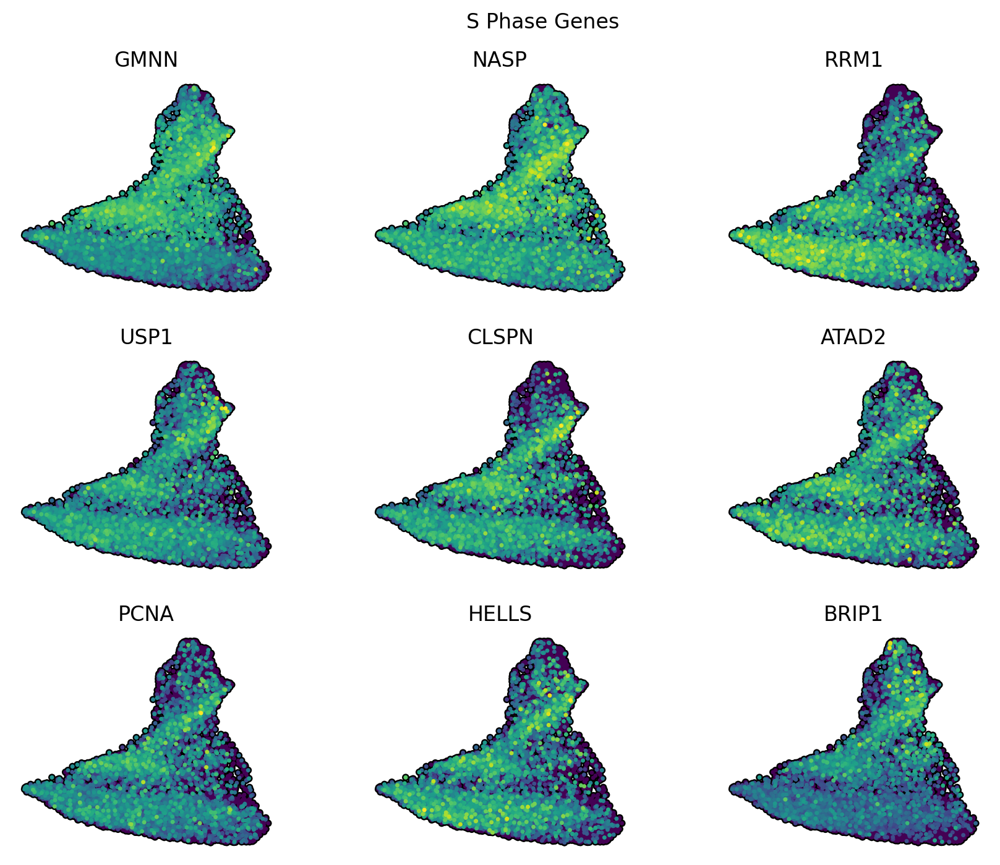

In [31]:
adata.X = adata.layers['log_norm'].copy()

# get higest expressed S phase genes
s_genes = [gene for gene in s_genes if gene in adata.var_names]
mean_expr = adata[:, s_genes].X.mean(axis=0).A1  
top9_genes = [s_genes[i] for i in mean_expr.argsort()[::-1][:9]]

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 2.5, 2.5

fig = sc.pl.draw_graph(
    adata, 
    color=top9_genes,
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    colorbar_loc=None,
    outline_color=('k', 'k'),
    frameon=False,
    show=False, 
    return_fig=True,  
)

fig.suptitle("S Phase Genes", y=0.95)
plt.show()

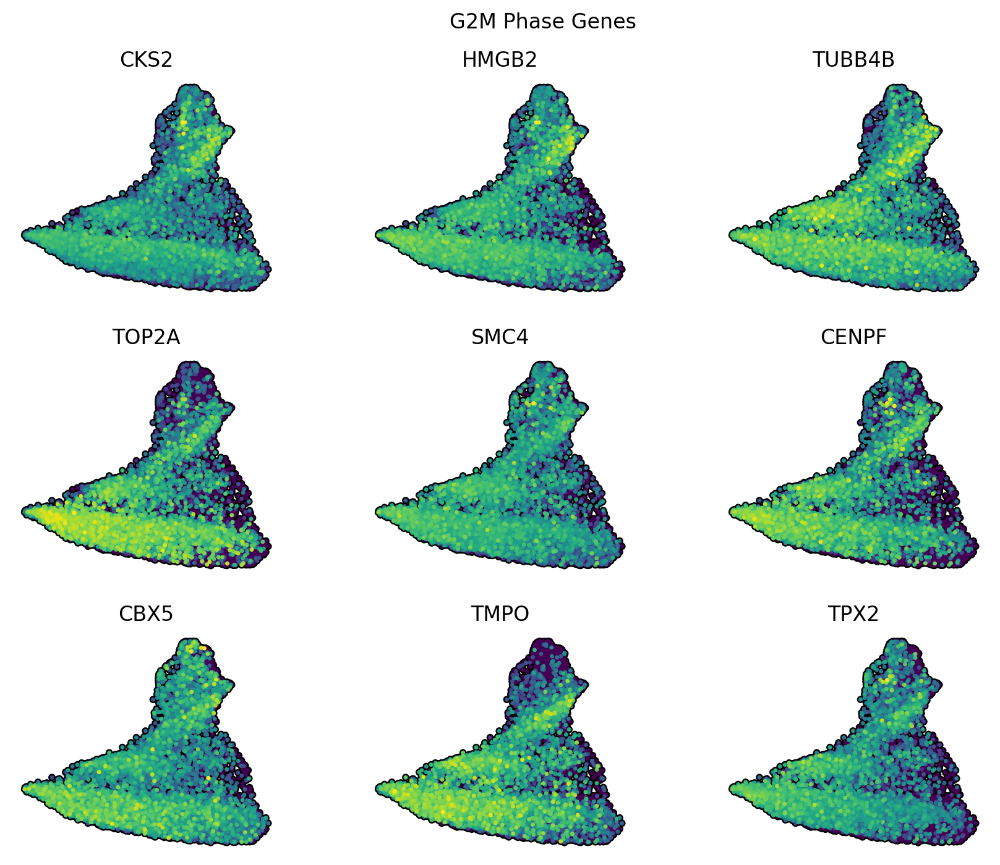

In [32]:
# get higest expressed S phase genes
g2m_genes = [gene for gene in g2m_genes if gene in adata.var_names]
mean_expr = adata[:, g2m_genes].X.mean(axis=0).A1  
top9_genes = [g2m_genes[i] for i in mean_expr.argsort()[::-1][:9]]

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 2.5, 2.5

fig = sc.pl.draw_graph(
    adata, 
    color=top9_genes,
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    colorbar_loc=None,
    outline_color=('k', 'k'),
    frameon=False,
    show=False, 
    return_fig=True,  
)

fig.suptitle("G2M Phase Genes", y=0.95)
plt.show()

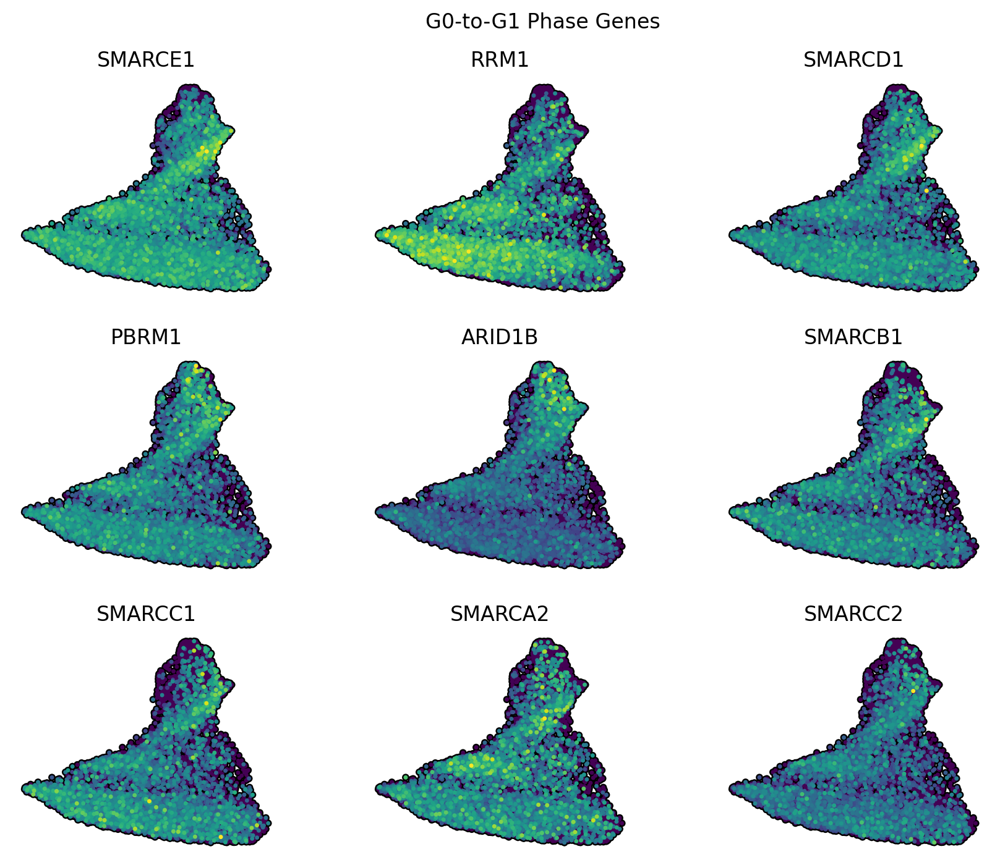

In [33]:
# get higest expressed S phase genes
g2m_genes = [gene for gene in g0_to_g1 if gene in adata.var_names]
mean_expr = adata[:, g2m_genes].X.mean(axis=0).A1  
top9_genes = [g2m_genes[i] for i in mean_expr.argsort()[::-1][:9]]

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 2.5, 2.5

fig = sc.pl.draw_graph(
    adata, 
    color=top9_genes,
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    colorbar_loc=None,
    outline_color=('k', 'k'),
    frameon=False,
    show=False, 
    return_fig=True,  
)

fig.suptitle("G0-to-G1 Phase Genes", y=0.95)
plt.show()

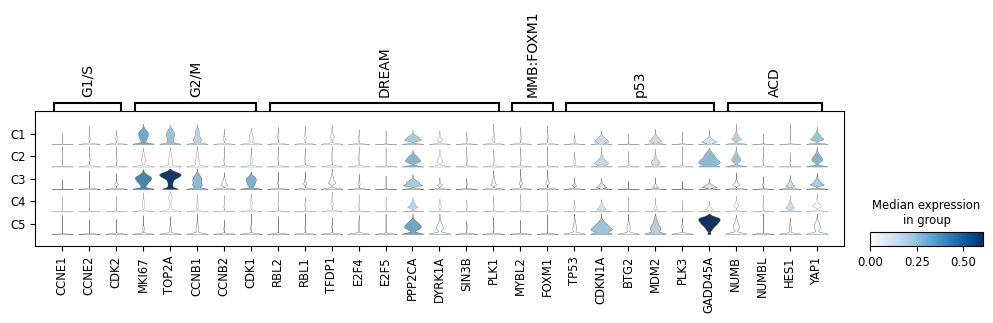

In [44]:
genes_to_plot = {
    "G1/S": ["CCNE1", "CCNE2", "CDK2"],
    "G2/M": ["MKI67", "TOP2A", "CCNB1", "CCNB2", "CDK1"], 
    "DREAM": ["RBL2", "RBL1", "TFDP1", "E2F4", "E2F5", "PPP2CA", "DYRK1A", "SIN3B", "PLK1"], 
    "MMB:FOXM1": ["MYBL2", "FOXM1"], 
    "p53": ["TP53", "CDKN1A", "BTG2", "MDM2", "PLK3", "GADD45A"], 
    "ACD": ["NUMB", "NUMBL", "HES1", "YAP1"],
}
            
            
            
plt.rcdefaults()
sc.pl.stacked_violin(
    adata,
    groupby='cluster_str',
    var_names=genes_to_plot,
    layer='log_norm',
    standard_scale='var',
)

In [37]:
df.head()

,G1/S_transition,G2/M_transition,CC_checkpoints,Cell_cycle_reg,Pos_proliferation,Neg_proliferation,quiescence,AS,Chromatin,Circadian,Core_repro,NOTCH_signaling,Asymm_PCP,FOXO,p53_acyivity,DREAM/negE2F,senes_stress,sasp
0,FBXW7,CDC25A,CHFR,YTHDF2,EMP2,IGFBP5,ATF3,CWC27,H2AJ,TEF,HDAC9,FBXW7,SMURF2,TXN,MAPK11,CDC25A,H2AZ2,H2AZ2
1,CCNP,CDK6,CDK1,PRKCA,TNXB,ZBTB7C,ATF4,DDX20,HCFC1,SFPQ,POLR2C,ST3GAL4,SMURF1,PLXNA4,TPX2,CDK1,ACD,H2BC9
2,EZH2,NES,MRNIP,OBSL1,CX3CL1,NTRK1,CTNNB1,RBM3,INO80E,THRAP3,PTN,FCER2,WNT5A,SOD2,TAF9B,E2F1,H2BC9,JUN
3,APBB1,CDK1,DGKZ,LOC102724428,CCND2,KDF1,BACH2,RBM5,HDAC8,NKX2-1,JUN,PSMA7,SCRIB,KAT2B,DYRK2,LIN52,H2BC4,UBE2C
4,DDX3X,FBXL15,BARD1,MAGEA4,LIG4,BTG3,JUN,RBM23,BAZ2A,LOC102724428,MED31,TBL1X,PSMC6,IGFBP1,MDM4,RBL1,H2BC5,H2BC4


In [50]:
df['Asymm_PCP'].unique()

array(['SMURF2', 'SMURF1', 'WNT5A', 'SCRIB', 'PSMC6', 'PSMC4', 'PSMC5',
       'PSMC2', 'PSMC3', 'PSMC1', 'PSMD11', 'PSMD13', 'PSMD12', 'PSMD14',
       'PARD6A', 'PSMD7', 'PSMD8', 'PSMD6', 'PSMD3', 'DVL2', 'PSMD1',
       'PSMD2', 'RPS27A', 'FZD2', 'FZD1', 'FZD4', 'FZD3', 'FZD5', 'ADRM1',
       'FZD8', 'FZD7', 'PSMA6', 'VANGL2', 'PSMA7', 'PSMA4', 'PSMA5',
       'SEM1', 'PSMA2', 'PSMA3', 'PSMA1', 'UBA52', 'PRICKLE1', 'PSMB7',
       'PSMB5', 'PSMB6', 'PSMB3', 'UBC', 'PSMB4', 'UBB', 'PSMB1', 'PSMB2',
       nan], dtype=object)

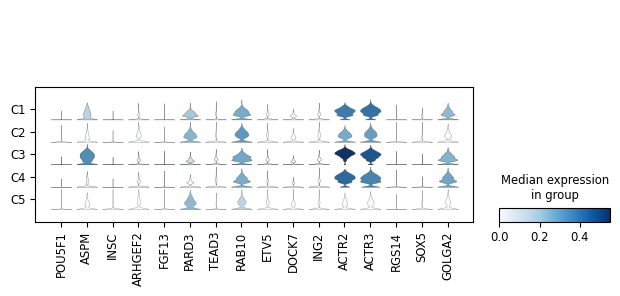

In [43]:
# genes_to_plot = df['Asymm_PCP'].unique()
genes_to_plot = ['POU5F1', 'ASPM', 'PAX6', 'INSC', 'WNT9B', 'ARHGEF2', 'FGF13', 'ZBTB16', 'PARD3', 'TEAD3', 'RAB10', 'ETV5', 
                 'DOCK7', 'ING2', 'ACTR2', 'ACTR3', 'RGS14', 'SOX5', 'GOLGA2']

genes_to_plot = [gene for gene in genes_to_plot if gene in adata.var_names]

sc.pl.stacked_violin(
    adata,
    groupby='cluster_str',
    var_names=genes_to_plot,
    layer='log_norm',
    standard_scale='var',
)

In [46]:
pdf.head()

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,abs_lfc,gene_type,mt,ribo
58,C1,TNFSF10,35.861221,2.209049,1.229428e-281,3.586564e-279,0.633457,0.187977,2.209049,protein_coding,False,False
1,C1,BST2,54.226276,2.122854,0.000000e+00,0.000000e+00,0.978810,0.679934,2.122854,protein_coding,False,False
289,C1,KISS1,19.924000,2.095490,2.520330e-88,1.363371e-86,0.372119,0.131161,2.095490,protein_coding,False,False
145,C1,IFNE,26.235420,2.088412,1.048478e-151,1.152150e-149,0.442379,0.103939,2.088412,protein_coding,False,False
11,C1,RSAD2,48.281349,2.059977,0.000000e+00,0.000000e+00,0.965056,0.549804,2.059977,protein_coding,False,False


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cluster_str']`


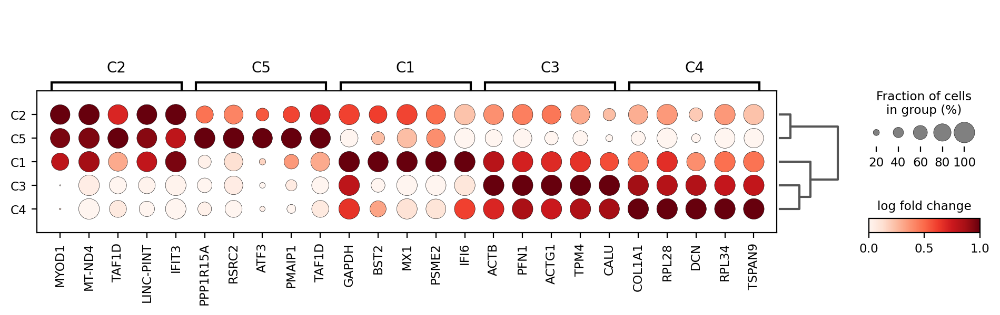

In [47]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=5,
    key='deg_all_clusters',
    values_to_plot='logfoldchanges',
    standard_scale='var',
)